# Table of Content

1. Setup [5 min]
  *   Runtime
  *   Installations
  *   Mount Google Drive
  *   Dataset download

2. Sen1Floods11 Dataset [15 min]

  *   Overview
  *   Visualizations
  *   Dataset preparation
3. Finetuning Geo Foundation Models (TerraMind / Prithvi) [20 min]

  *   Tensorboard
  *   Configuration file
  *   Finetuning for 5 epochs
  *   Test metrics for trained model

4. Inference

Sentinel-2 product search [10 min]
- Web interface
- STAC API in Python

Inference workflow on Sentinel-2 product [20 min]
- ONNX conversion
- Inference steps explanation
- Run
- Visualizations outputs

5. Q & A [10 min]

# Setup

In colab:
1. Go to "Runtime" -> "Change runtime type" -> Select "T4 GPU"
2. Install TerraTorch (Geo Foundation Model traning/inferencing framework)

In [ ]:
!pip install git+https://github.com/IBM/terratorch.git
!pip install gdown tensorboard

In [ ]:
# download hands-on repo with the scripts, configs
!git clone -b ai_eo https://github.com/DaFab-AI-eu/Summer-School-2025.git

In [ ]:
#!cd Summer-School-2025 && git pull

Mount the Google drive in order so save experiment's results.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# create directory for all experimentations
import os
path2dir = '/content/drive/MyDrive/EO_AI' # if you want to save experiments and don't lose them
path2dir = '/content/EO_AI' # in case don't want to save to google drive

os.makedirs(path2dir, exist_ok=True)

Download the dataset from Google Drive

In [ ]:
import os
import gdown

output = os.path.join(path2dir, "sen1floods11_v1.1.tar.gz")
if not os.path.isfile(output):
    gdown.download("https://drive.google.com/uc?id=1lRw3X7oFNq_WyzBO6uyUJijyTuYm23VS", output)
    !tar -xzf $output -C $path2dir
!ls $path2dir/sen1floods11_v1.1/data

Downloading...
From (original): https://drive.google.com/uc?id=1lRw3X7oFNq_WyzBO6uyUJijyTuYm23VS
From (redirected): https://drive.google.com/uc?id=1lRw3X7oFNq_WyzBO6uyUJijyTuYm23VS&confirm=t&uuid=5418a60c-fdde-4c14-9b02-03dc40d04b2e
To: /content/EO_AI/sen1floods11_v1.1.tar.gz
100%|██████████| 1.77G/1.77G [00:25<00:00, 68.7MB/s]


CopernicusDEM  JRCWaterHand  LabelHand	S1GRDHand  S1OtsuLabelHand  S2L1CHand


# Sen1Floods11 Dataset


## Overview

Sen1Floods11 is a multimodal dataset that provides Sentinel-2 L2A and Sentinel-1 GRD data.

Span all 14 biomes, 357 ecoregions, and 6 continents of the world across 11 flood events

Total dataset length - 446 (hand labeled images): 252 (train), 89 (validation), 90 (test).

TerraTorch provides generic data modules that work directly with PyTorch Lightning (e. g. GenericNonGeoSegmentationDataModule, Sen1Floods11NonGeoDataModule).

## Preprocess dataset

Modify labels of clouds/ no data (-1) to no_water.

In [ ]:
# Datamodule by default doesn't take
# into considaration -1 (clouds, no-data) in dataset labels (ignores -1 label during loss computation ->
# leads to False Positive water class detection in clouds)
import os
from glob import glob

import rioxarray
import xarray as xr

path2labels = f"{path2dir}/sen1floods11_v1.1/data/LabelHand" # rename to origin
path2labels_v1 = f"{path2dir}/sen1floods11_v1.1/data/LabelHand_v1"

os.makedirs(path2labels_v1, exist_ok=True)
# create new labels -> -1 -> 0
for path_ in glob(os.path.join(path2labels, "*.tif")):
  data = rioxarray.open_rasterio(path_, masked=True)
  data_ = xr.where(data == -1, 0, data) # save data labels without -1 (bad data -> other class / no water)
  # save crs too
  data_ = (
    data_.rio.write_crs(data.rio.crs)
    .rio.set_spatial_dims(x_dim=data.rio.x_dim, y_dim=data.rio.y_dim)
    .rio.write_coordinate_system()
  )
  data_.rio.to_raster(os.path.join(path2labels_v1, os.path.split(path_)[1]))

### Preprocess dataset for Prithvi datamodule

In [ ]:
# structure dataset for Prithvi
# https://github.com/IBM/terratorch/blob/main/terratorch/datasets/sen1floods11.py#L24
import os

data_dir = "v1.1/data/flood_events/HandLabeled/S2Hand"
label_dir = "v1.1/data/flood_events/HandLabeled/LabelHand"
split_dir = "v1.1/splits/flood_handlabeled"
metadata_file = "v1.1/Sen1Floods11_Metadata.geojson"

path2labels = f"{path2dir}/sen1floods11_v1.1/data/LabelHand_v1" # without -1 label
path2images = f"{path2dir}/sen1floods11_v1.1/data/S2L1CHand"
path2meta = f"{path2dir}/sen1floods11_v1.1/Sen1Floods11_Metadata.geojson"
path2split = f"{path2dir}/sen1floods11_v1.1/splits"
final_folder = "/content/sen1floods11_v1.1"

os.makedirs(os.path.join(final_folder, split_dir), exist_ok=True)
os.makedirs(os.path.join(final_folder, label_dir), exist_ok=True)
os.makedirs(os.path.join(final_folder, data_dir), exist_ok=True)

!cp -r $path2split/* $final_folder/$split_dir
!cp -r $path2labels/* $final_folder/$label_dir
!cp -r $path2images/* $final_folder/$data_dir
!cp -r $path2meta $final_folder/$metadata_file

## Visualization of dataset

In [33]:
import os
from glob import glob

import numpy as np
import rioxarray

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.figure import Figure
from matplotlib.patches import Rectangle


def compute_index(img1, img2, nan_val=0):
    img1 = img1.astype("float32")
    img2 = img2.astype("float32")
    nd = (img1 - img2) / ((img1 + img2 + 1e-4))
    nd[img1 == nan_val] = -1
    nd = nd.clip(min=-1, max=1)
    return nd

def plot_images(segmentation_mask_files, image_files, idx=0, flag_no_data=False,
                cmap_name="jet"):
    # cmap_name = "Blues"
    num_images = 6
    plot_name = os.path.split(segmentation_mask_files[idx])[-1].split("_")[0]

    data = rioxarray.open_rasterio(image_files[idx], masked=True)
    image = data.fillna(0).to_numpy()

    ndwi = compute_index(img1=image[2], img2=image[7]) # green, nir

    # RGB -> channels-last
    rgb_indices = [3, 2, 1]
    mask = rioxarray.open_rasterio(segmentation_mask_files[idx], masked=True).to_numpy()[0]

    if not flag_no_data: # if label -1 (no_data) present -> no_water class
        mask[mask == -1] = 0

    image_rgb = np.clip(image[rgb_indices, ...].transpose(1, 2, 0) * 0.00035, 0, 1)

    #cmap_name = "Blues"
    start_idx = -1 if flag_no_data else 0
    norm = mpl.colors.Normalize(vmin=start_idx, vmax=1)

    fig, ax = plt.subplots(1, num_images, figsize=(num_images * 3, 5), layout="compressed")

    ax[0].axis("off")

    ax[3].axis("off")
    ax[3].title.set_text("RGB Composite")
    ax[3].imshow(image_rgb)

    ax[2].axis("off")
    ax[2].title.set_text("RGB & GT water contour")
    ax[2].imshow(image_rgb)
    ax[2].contour(mask, levels=[0, 1, 2], colors="w")

    ax[1].axis("off")
    ax[1].title.set_text("Ground Truth (GT) Mask")
    ax[1].imshow(mask, cmap=cmap_name, norm=norm)


    ax[4].axis("off")
    ax[4].title.set_text("SWIR1,NIR,RED Composite") # taken from https://spaceml-org.github.io/ml4floods/content/ml4ops/HOWTO_Run_Inference_multioutput_binary.html
    ax[4].imshow(np.clip(image[[11, 4, 3], ...].transpose(1, 2, 0) * 0.00035, 0, 1))

    cmap = plt.get_cmap(cmap_name)
    if flag_no_data:
        legend_label = ["no_data", "no_water", "water"]
    else:
        legend_label = ["no_water", "water"]
    legend_data = [[i + start_idx, cmap(norm(i + start_idx)), legend_label[i]] for i in range(len(legend_label))]
    handles = [Rectangle((0, 0), 1, 1, color=tuple(v for v in c)) for k, c, n in legend_data]
    labels = [n for k, c, n in legend_data]
    ax[0].legend(handles, labels, loc="center")
    ax[0].title.set_text(f"Country - {plot_name}")

    ax[5].axis("off")
    ax[5].title.set_text("NDWI")
    ax[5].imshow(ndwi, cmap="RdBu_r", vmin=-1, vmax=1.)

### Plot with no_data label included

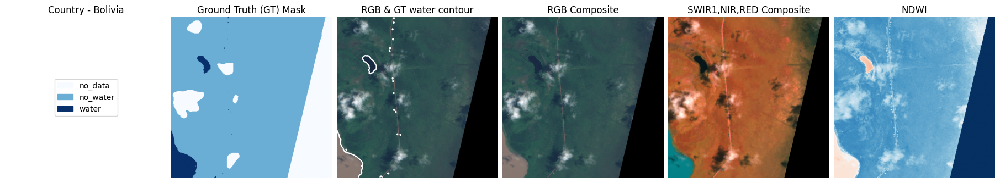

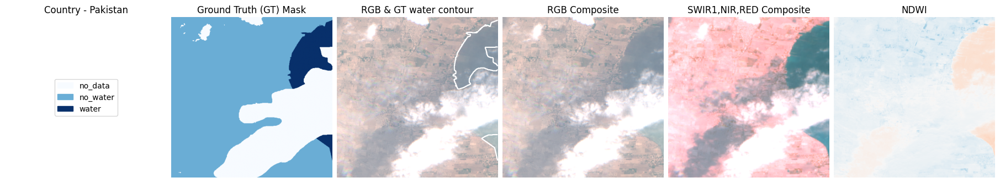

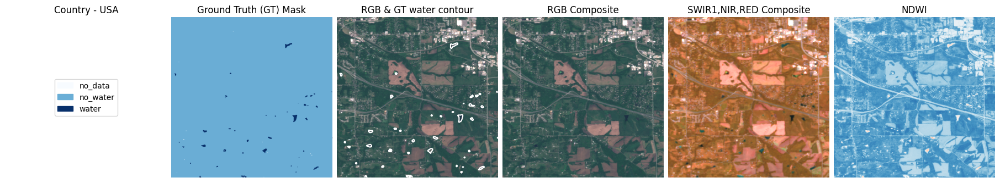

In [ ]:
# plotting a few samples
image_files = sorted(glob(os.path.join(f"{path2dir}/sen1floods11_v1.1/data/S2L1CHand", "*_S2Hand.tif")))
segmentation_mask_files = sorted(glob(os.path.join(f"{path2dir}/sen1floods11_v1.1/data/LabelHand", "*_LabelHand.tif")))

for idx in range(3, len(image_files), 200):
    plot_images(segmentation_mask_files, image_files, idx=idx, flag_no_data=True,
                cmap_name = "Blues")

### Plot with no_data label excluded

In [ ]:
# plotting a few samples
image_files = sorted(glob(os.path.join(f"{path2dir}/sen1floods11_v1.1/data/S2L1CHand", "*_S2Hand.tif")))
segmentation_mask_files = sorted(glob(os.path.join(f"{path2dir}/sen1floods11_v1.1/data/LabelHand", "*_LabelHand.tif")))

for idx in range(3, len(image_files), 14):
    plot_images(segmentation_mask_files, image_files, idx=idx, flag_no_data=False,
                cmap_name = "Blues")

# Finetuning

## TerraTorch model registry

TerraTorch includes its own backbone registry with many EO FMs. It also includes meta registries for all model components that include other sources like timm image models or SMP decoders.

In [ ]:
from terratorch.registry import BACKBONE_REGISTRY, TERRATORCH_BACKBONE_REGISTRY, TERRATORCH_DECODER_REGISTRY

/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


In [ ]:
# Print all TerraMind v1 backbones.
[backbone
 for backbone in TERRATORCH_BACKBONE_REGISTRY
 if 'terramind_v1' in backbone]

['terramind_v1_base',
 'terramind_v1_base_tim',
 'terramind_v1_large',
 'terramind_v1_large_tim',
 'terramind_v1_tiny',
 'terramind_v1_tiny_tim',
 'terramind_v1_small',
 'terramind_v1_small_tim']

In [ ]:
# Print all Prithvi backbones.
[backbone
 for backbone in TERRATORCH_BACKBONE_REGISTRY
 if 'prithvi' in backbone]

['prithvi_eo_tiny',
 'prithvi_eo_v1_100',
 'prithvi_eo_v2_tiny_tl',
 'prithvi_eo_v2_100_tl',
 'prithvi_eo_v2_300',
 'prithvi_eo_v2_600',
 'prithvi_eo_v2_300_tl',
 'prithvi_eo_v2_600_tl']

In [ ]:
# Available decoders. Use the UNetDecoder in this example.
list(TERRATORCH_DECODER_REGISTRY)

['ASPPModule',
 'ASPPHead',
 'ASPPSegmentationHead',
 'ASPPRegressionHead',
 'FCNDecoder',
 'IdentityDecoder',
 'LinearDecoder',
 'MLPDecoder',
 'SatMAEHead',
 'UNetDecoder',
 'UperNetDecoder']

## Fine-tune TerraMind via PyTorch Lightning

With TerraTorch, we use standard Lightning ([doc](https://lightning.ai/docs/pytorch/stable/cli/lightning_cli_advanced.html)) components for the fine-tuning.
These include callbacks, the trainer and dataset class.
TerraTorch provides EO-specific tasks that define the training, validation, testing and prediction steps.

In case of water/flood detection (semantic segmentation) - use the `SemanticSegmentationTask`.

We refer to the [TerraTorch paper](https://arxiv.org/abs/2503.20563) for a detailed explanation of the TerraTorch tasks ([doc](https://ibm.github.io/terratorch/stable/guide/quick_start/)).

## Tensorboard

In [ ]:
# download ready tensorboard metrics for 50 epochs
# https://drive.google.com/file/d/1kbRTVfqOntJbeAQk4qzdK5qkkZmQkBZa/view?usp=drive_link (terramind)
# https://drive.google.com/file/d/1Ldox-YbpgVTj8W1ysA7WVP1NeTzPc0sV/view?usp=drive_link (prithvi)
import gdown

output = os.path.join(path2dir, "terramind_sen1floods11", "events.out.tfevents.1757427251.26d83bf38eab.3356.0")
os.makedirs(os.path.split(output)[0], exist_ok=True)
gdown.download("https://drive.google.com/uc?id=1kbRTVfqOntJbeAQk4qzdK5qkkZmQkBZa", output)

output = os.path.join(path2dir, "prithvi_sen1floods11", "events.out.tfevents.1757527797.edc2ddf86aba.7467.0")
os.makedirs(os.path.split(output)[0], exist_ok=True)
gdown.download("https://drive.google.com/uc?id=1Ldox-YbpgVTj8W1ysA7WVP1NeTzPc0sV", output)

In [ ]:
# Before starting the fine-tuning, you can start the tensorboard with:
%load_ext tensorboard
%tensorboard --logdir $path2dir/

## Fine-tuning via CLI

Locally, run the fine-tuning command in your terminal rather than in this notebook.

In Colab, you want to restart the session to free up GPU memory and set `freeze_backbone: true` to avoid OOM errors.

### TerraMind model

Modified configurations taken from [config](https://raw.githubusercontent.com/IBM/terramind/refs/heads/main/configs/terramind_v1_base_sen1floods11.yaml).

In [ ]:
# config for TerraMind (/content/Summer-School-2025/AI_EO/config/terramind_v1_base_sen1floods11.yaml)
# config for Prithvi (/content/Summer-School-2025/AI_EO/config/prithvi_v2_sen1flood11.yaml)
# Run fine-tuning

# !!!! Change data.init_args.batch_size to 2 if run on CPU
# configuration parameters in lightning - https://lightning.ai/docs/pytorch/stable/cli/lightning_cli_advanced_3.html
!terratorch fit -c /content/Summer-School-2025/AI_EO/config/terramind_v1_base_sen1floods11.yaml \
--trainer.default_root_dir=$path2dir/terramind_base_sen1floods11/ \
--data.init_args.batch_size=2 \
--data.init_args.train_data_root.S2L1C=$path2dir/sen1floods11_v1.1/data/S2L1CHand \
--data.init_args.val_data_root.S2L1C=$path2dir/sen1floods11_v1.1/data/S2L1CHand \
--data.init_args.test_data_root.S2L1C=$path2dir/sen1floods11_v1.1/data/S2L1CHand \
--data.init_args.train_label_data_root=$path2dir/sen1floods11_v1.1/data/LabelHand_v1 \
--data.init_args.val_label_data_root=$path2dir/sen1floods11_v1.1/data/LabelHand_v1 \
--data.init_args.test_label_data_root=$path2dir/sen1floods11_v1.1/data/LabelHand_v1 \
--data.init_args.train_split=$path2dir/sen1floods11_v1.1/splits/flood_train_data.txt \
--data.init_args.val_split=$path2dir/sen1floods11_v1.1/splits/flood_valid_data.txt \
--data.init_args.test_split=$path2dir/sen1floods11_v1.1/splits/flood_test_data.txt \
--trainer.callbacks.dirpath $path2dir/terramind_base_sen1floods11/checkpoints/

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:albumentations.check_version:A new version of Albumentations is available: 2.0.8 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations
2025-09-09 14:13:25.381476: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757427205.401431    3356 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757427205.408241    3356 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1757427205.423131    3356 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1757427205.423157    3356 computation_pla

### Prithvi model

Modified configurations taken from [config](https://huggingface.co/ibm-nasa-geospatial/Prithvi-EO-2.0-300M-TL-Sen1Floods11/tree/main).

In [ ]:
# config for TerraMind (/content/Summer-School-2025/AI_EO/config/terramind_v1_base_sen1floods11.yaml)
# config for Prithv7i (/content/Summer-School-2025/AI_EO/config/prithvi_v2_sen1flood11.yaml)
# Run fine-tuning

# configuration parameters in lightning - https://lightning.ai/docs/pytorch/stable/cli/lightning_cli_advanced_3.html
!terratorch fit -c /content/Summer-School-2025/AI_EO/config/prithvi_v2_sen1flood11.yaml \
--trainer.default_root_dir=$path2dir/prithvi/ \
--data.init_args.batch_size=2 \
--data.init_args.data_root=/content/sen1floods11_v1.1 \
--trainer.callbacks.dirpath $path2dir/prithvi/checkpoints/ \
#--trainer.callbacks.help "lightning.pytorch.callbacks.ModelCheckpoint"


INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:albumentations.check_version:A new version of Albumentations is available: 2.0.8 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
2025-09-15 12:03:30.541288: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757937810.566158   36629 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757937810.573216   36629 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plug

## Test metrics

Download finetuned models from google dirve.

In [ ]:
# terramind pretrained model checkpoints (https://drive.google.com/file/d/15fAjXTfavK1KV1Rs6OUMCP44XXBeQC3t/view?usp=drive_link)
output = os.path.join(path2dir, "terramind_sen1floods11.ckpt")
gdown.download("https://drive.google.com/uc?id=15fAjXTfavK1KV1Rs6OUMCP44XXBeQC3t", output)

In [ ]:
# prithvi pretrained model checkpoints (https://drive.google.com/file/d/19l2lTL5WAw3dyLrPCtLbeOoAmFt7XEXR/view?usp=drive_link)
output = os.path.join(path2dir, "prithvi_sen1floods11.ckpt")
gdown.download("https://drive.google.com/uc?id=19l2lTL5WAw3dyLrPCtLbeOoAmFt7XEXR", output)

In [ ]:
!terratorch test -c /content/Summer-School-2025/AI_EO/config/terramind_v1_base_sen1floods11.yaml --ckpt_path $path2dir/"terramind_sen1floods11.ckpt"

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:albumentations.check_version:A new version of Albumentations is available: 2.0.8 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations
2025-09-09 14:49:40.216338: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757429380.237003   15008 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757429380.243063   15008 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1757429380.259364   15008 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1757429380.259395   15008 computation_pla

In [ ]:
!terratorch test -c /content/Summer-School-2025/AI_EO/config/prithvi_v2_sen1flood11.yaml --ckpt_path $path2dir/"prithvi_sen1floods11.ckpt"

INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:albumentations.check_version:A new version of Albumentations is available: 2.0.8 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
2025-09-10 19:10:28.617799: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1757531428.650896   23560 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1757531428.661460   23560 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plug

# Inference

## ONNX convert

In [ ]:
# install needed packages
!pip install onnx onnxruntime

Convert to onnx either finetuned above (provide paths) or pretrained (https://www.google.com/url?q=https%3A%2F%2Fdrive.google.com%2Fdrive%2Ffolders%2F1Z5UgCCamR5O8RnkhQhLLdOraOY1ZyF5o)

In [ ]:
!python .\Summer-School-2025\scripts\convert2onnx_terratorch.py -i "terramind_v1\\checkpoints.ckpt" -c "terramind_v1\\config.yaml" -o "terramind_v1_base_sen1floods11_s_896_without_clouds.onnx"

## Searching Sentinel-2 products

1. Web (e. g. AWS: https://registry.opendata.aws/sentinel-2/ https://viewer.aws.element84.com/, [Planetary Computer](https://planetarycomputer.microsoft.com/explore?c=9.4181%2C45.1679&z=8.28&v=2&d=sentinel-2-l2a&m=cql%3A5ca37235302f8ae137c6a205dccbc7c0&r=Natural+color&s=false%3A%3A100%3A%3Atrue&sr=desc&ae=0))
2. STAC API Python

In [ ]:
!pip install pystac-client
!pip install mapclassify

In [ ]:
import pandas as pd
import geopandas as gpd


def display_tile(gdf, path2save, bounds=None, id_name='granule', tooltip=[
          "granule",
          "datetime",
      ], name_g="Tiles",
                 width="400px", height="500px", bbox=None):
    import shapely
    import folium
    from branca.element import Figure

    fig = Figure(width=width, height=height)
    map1 = folium.Map()
    fig.add_child(map1)

    if bbox is not None:
        folium.GeoJson(
          shapely.geometry.box(*bbox),
          style_function=lambda x: dict(fill=False, weight=2, opacity=0.7, color="olive"),
          name="Query",
          tooltip="Query",
      ).add_to(map1)

    gdf.explore(
        id_name,
        categorical=True,
        tooltip=tooltip,
        popup=True,
        style_kwds=dict(fillOpacity=0.1, width=2),
        name=name_g,
        m=map1,
    )
    if bounds is not None:  # lon, lat

        def convert_bounds(bbox, invert_y=False):
            """
            Helper method for changing bounding box representation to leaflet notation

            ``(lon1, lat1, lon2, lat2) -> ((lat1, lon1), (lat2, lon2))``
            """
            x1, y1, x2, y2 = bbox
            if invert_y:
                y1, y2 = y2, y1
            return ((y1, x1), (y2, x2))

        map1.fit_bounds(bounds=convert_bounds(gdf.unary_union.bounds))
    if path2save:
        map1.save(path2save) # fig
    display(fig)

def get_search_json(datatime, bbox, filters=None, url_l="https://earth-search.aws.element84.com/v1",
                    collections=["sentinel-2-l2a"], intersects=None, modifier=None, limit=100):
    from pystac_client import Client

    catalog = Client.open(url_l, modifier=modifier)
    query = catalog.search(
      collections=collections, datetime=datatime, limit=limit,
      query=filters,
      bbox=bbox,
      intersects=intersects,
    )
    items = list(query.items())
    print(f"Found: {len(items):d} datasets in {url_l} collection {collections}")
    # Convert STAC items into a GeoJSON FeatureCollection
    stac_json = query.item_collection_as_dict()
    return stac_json, items

def get_bbox(g_region, region=None):
    # https://geojson.io/
    bbox = gpd.GeoDataFrame.from_features(g_region, "epsg:4326").total_bounds if g_region else None
    if region == "Occitanie":
        bbox = [-0.61245063, 42.30470996,  4.88241514, 45.38406975]
    elif region == "Bourgogne":
        bbox = [ 2.63586084, 46.15289328,  7.05414937, 48.62242647]
    elif region == "Brandenburg":
        bbox = [11.15614347, 51.30204769, 14.83091904, 53.60094247]
    elif region == "France":
        bbox = [-5.00921008, 42.43558694,  8.01030169, 51.36289272]
    elif region == "Germany":
        bbox = [ 6.75081103, 47.17641794, 15.04138684, 55.06089273]

    return bbox

In [ ]:
threshold = 5
filters = {
    "eo:cloud_cover": {"lt": threshold},
    "s2:nodata_pixel_percentage": {"lt": threshold},
}
year = 2025
datatime = f"{year}-03-01/{year}-04-30"
bbox = get_bbox(g_region=None, region="Bourgogne")
stac_json, items = get_search_json(datatime=datatime, bbox=bbox, filters=filters,
                                       intersects=None,
                                       url_l="https://earth-search.aws.element84.com/v1",
                                       collections=["sentinel-2-l2a"], modifier=None, limit=200)
gdf = gpd.GeoDataFrame.from_features(stac_json, "epsg:4326")
gdf["item_id"] = [item.id for item in items]
gdf["good_perc"] = (100. - gdf["s2:nodata_pixel_percentage"]) * (100 - gdf["eo:cloud_cover"]) / 100

pd.set_option('display.max_columns', None)
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):
gdf


In [ ]:
gdf[['s2:product_uri', 'datetime', 'eo:cloud_cover', 's2:vegetation_percentage', 's2:nodata_pixel_percentage', 'good_perc']]

,s2:product_uri,datetime,eo:cloud_cover,s2:vegetation_percentage,s2:nodata_pixel_percentage,good_perc
0,S2A_MSIL2A_20250430T102701_N0511_R108_T31TGN_2...,2025-04-30T10:38:06.759000Z,2.193101,87.545073,0.000000,97.806899
1,S2A_MSIL2A_20250430T102701_N0511_R108_T32TLT_2...,2025-04-30T10:38:04.290000Z,1.091105,86.077935,0.000000,98.908895
2,S2A_MSIL2A_20250430T102701_N0511_R108_T31UGP_2...,2025-04-30T10:37:52.254000Z,2.606332,88.615721,3.779894,93.712291
3,S2A_MSIL2A_20250430T102701_N0511_R108_T32ULU_2...,2025-04-30T10:37:49.917000Z,2.007578,81.431460,0.000000,97.992422
4,S2B_MSIL2A_20250429T104619_N0511_R051_T31TDM_2...,2025-04-29T10:58:13.178000Z,2.413874,89.093333,0.000000,97.586126
...,...,...,...,...,...,...
59,S2C_MSIL2A_20250305T104951_N0511_R051_T31TDN_2...,2025-03-05T10:58:21.525000Z,2.610433,65.416914,0.000000,97.389567
60,S2C_MSIL2A_20250305T104951_N0511_R051_T31UDP_2...,2025-03-05T10:58:07.159000Z,0.062807,46.107379,0.000000,99.937193
61,S2C_MSIL2A_20250305T104951_N0511_R051_T31UEP_2...,2025-03-05T10:58:03.029000Z,0.007943,57.223320,0.000000,99.992057
62,S2C_MSIL2A_20250302T104011_N0511_R008_T31TEM_2...,2025-03-02T10:48:35.268000Z,2.024014,80.155766,0.000000,97.975986


In [ ]:
display_tile(gdf, path2save=f"{path2dir}/STAC_API_search_visaulize.html"
                 , bounds=gdf.total_bounds, id_name='item_id', tooltip=[
        "item_id",
        "good_perc",
    ], name_g="Tiles",
                 width="100%", height="100%", bbox=None)

## Inference workflow

In [ ]:
# terramind pretrained model checkpoints (.onnx)
output = os.path.join(path2dir, "terramind_sen1floods11.onnx")
gdown.download("https://drive.google.com/uc?id=17wPCFl6r_qrxVlNqOTcBoBtPTTPAJ7z7", output)

In [ ]:
# prithvi pretrained model checkpoints (.onnx)
output = os.path.join(path2dir, "prithvi_sen1floods11.onnx")
gdown.download("https://drive.google.com/uc?id=1E_zwSbGxW_5ibO29Uv07Sx3alvs3gIx-", output)

In [ ]:
!sudo apt install parallel

In [ ]:
!pip install odc-stac odc-geo odc-algo onnxruntime

In [ ]:
!chmod +x "/content/Summer-School-2025/AI_EO/workflow_ai_water_detect.sh"
!cd ./Summer-School-2025/AI_EO && ./workflow_ai_water_detect.sh S2A_46QHH_20240916_0_L2A $path2dir/cache $path2dir/temp $path2dir/terramind_sen1floods11.onnx terramind 4 2

## Visualize the results

In [66]:
import shapely
import folium
from branca.element import Figure
from folium import raster_layers
from ipywidgets import widgets

import geopandas as gpd
# Load the raster data
import rasterio
from rasterio.plot import show

# Open the raster data (predicted water mask)
raster_file = f"{path2dir}/temp/final/S2A_46QHH_20240916_0_L2A//observed_water_mask_terramind.tiff" # change to yout path
raster = rasterio.open(raster_file)
# Get the bounds of the raster
bounds = raster.bounds

In [20]:
bounds

BoundingBox(left=799980.0, bottom=2190340.0, right=869240.0, top=2300040.0)

In [18]:
import rasterio
from rasterio.mask import mask
from rasterio.plot import reshape_as_image
from rasterio.transform import array_bounds
import shapely

width, height = 10000, 10000 # size to crop (visualize whole image in QGIS)
bounding_box = [bounds.left, bounds.top - height, bounds.left + width, bounds.top]

def crop_tif(raster_file, bounding_box):
  with rasterio.open(raster_file, 'r') as img:
      xy_resolution = img.res
      image_bounds = img.bounds
      bbox = shapely.geometry.box(*bounding_box)

      arr, transform = mask(img, shapes = [bbox], crop = True) # arr (3, 1000, 1000)
      # Cropped Image Bounds, using negative indexing as array could be 2 or 3D
      image_bounds = array_bounds(arr.shape[-2], arr.shape[-1], transform)

      arr = reshape_as_image(arr) # (1000, 1000, 3)
  return arr, image_bounds

In [53]:
pred, _ = crop_tif(raster_file, bounding_box)

files_rgb = [ f"{path2dir}/cache/visuals/S2A_46QHH_20240916_0_L2A/rgb_S2A_46QHH_20240916_0_L2A.tiff",
             f"{path2dir}/cache/visuals/S2A_46QHH_20240916_0_L2A/swir_nir_red_S2A_46QHH_20240916_0_L2A.tiff",
             f"{path2dir}/cache/visuals/S2A_46QHH_20240916_0_L2A/scl_S2A_46QHH_20240916_0_L2A.tiff"] # change to yout path

titles = ["RGB", "SWIR/NIR/RED Composite", "Scene Classification Layer"]
images = [crop_tif(raster_file, bounding_box)[0] for raster_file in files_rgb]
pred.shape, len(images)

((1000, 1000, 1), 3)

In [50]:
# compute NDWI index
path2green = f"{path2dir}/cache/assets/S2A_46QHH_20240916_0_L2A/green_10.nc"
path2nir = f"{path2dir}/cache/assets/S2A_46QHH_20240916_0_L2A/nir_10.nc"
nir = xr.open_dataset(path2nir,
                decode_coords="all").rio.clip_box(*bounding_box).isel(time=0)["nir"].values
green = xr.open_dataset(path2green,
                decode_coords="all").rio.clip_box(*bounding_box).isel(time=0)["green"].values

In [ ]:
ndwi = compute_index(img1=green, img2=nir)

def get_color(data, cmap='RdYlGn'):
  rgb = plt.get_cmap(cmap)(data)[:, :, :3]
  rgb = (rgb * 255).round().clip(0, 255).astype(np.uint8)
  return rgb

def index_to_rgb(data, cmap='RdYlGn'):
    # Scale NDVI to 0-1
    data = (data + 1) / 2
    return get_color(data, cmap)

ndwi_rgb = index_to_rgb(ndwi)
ndwi_rgb

array([[[183, 224, 117],
        [142, 207, 103],
        [ 66, 172,  90],
        ...,
        [185,  19,  38],
        [185,  19,  38],
        [185,  19,  38]],

       [[140, 205, 103],
        [ 93, 185,  97],
        [ 24, 149,  79],
        ...,
        [185,  19,  38],
        [185,  19,  38],
        [185,  19,  38]],

       [[ 60, 169,  89],
        [ 23, 147,  78],
        [  8, 119,  63],
        ...,
        [183,  17,  38],
        [181,  15,  38],
        [181,  15,  38]],

       ...,

       [[  9, 121,  64],
        [  5, 113,  60],
        [  1, 106,  56],
        ...,
        [181,  15,  38],
        [181,  15,  38],
        [181,  15,  38]],

       [[ 18, 138,  73],
        [ 10, 123,  65],
        [  3, 110,  58],
        ...,
        [183,  17,  38],
        [183,  17,  38],
        [181,  15,  38]],

       [[ 45, 161,  85],
        [ 21, 144,  76],
        [  9, 121,  64],
        ...,
        [183,  17,  38],
        [183,  17,  38],
        [183,  17,  38]]], dtype=uint8)
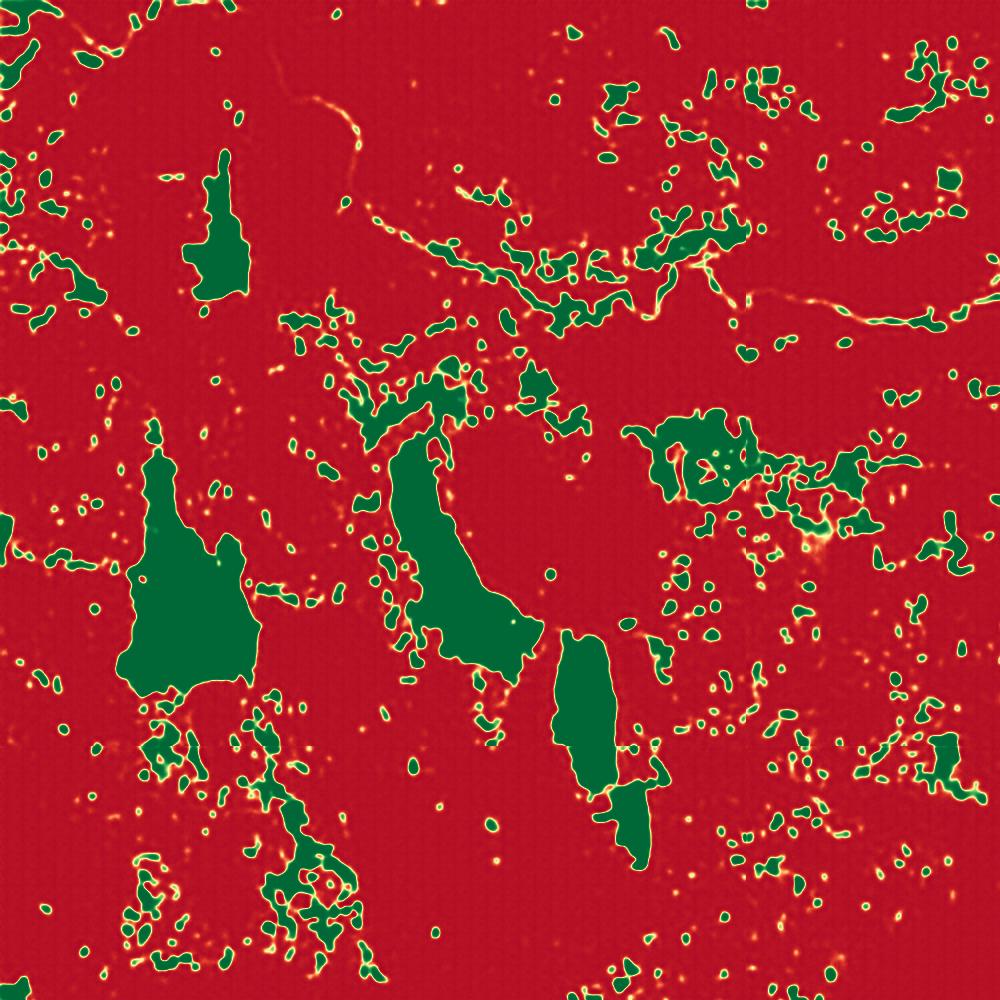

In [61]:
pred_rgb = get_color(pred[..., 0])
pred_rgb

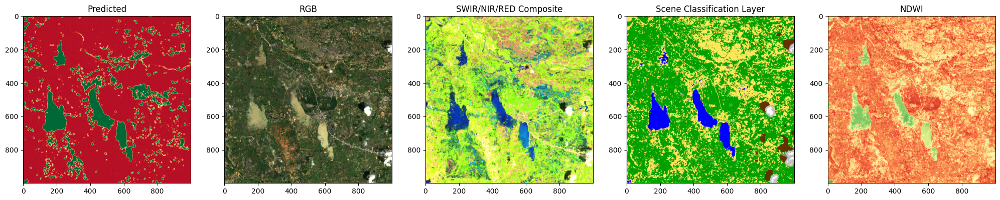

In [62]:
from matplotlib import pyplot as plt
# Plot generations
n_plots = len(images) + 2
fig, ax = plt.subplots(1, n_plots, figsize=(5 * n_plots, 5))

ax[0].imshow(pred_rgb)
ax[0].set_title('Predicted')

for i, value in enumerate(images):
    ax[i + 1].imshow(value)

    ax[i+1].set_title(f'{titles[i]}')

ax[-1].imshow(ndwi_rgb)
ax[-1].set_title("NDWI")
plt.show()

In [ ]:
# Install leafmap
!pip install leafmap


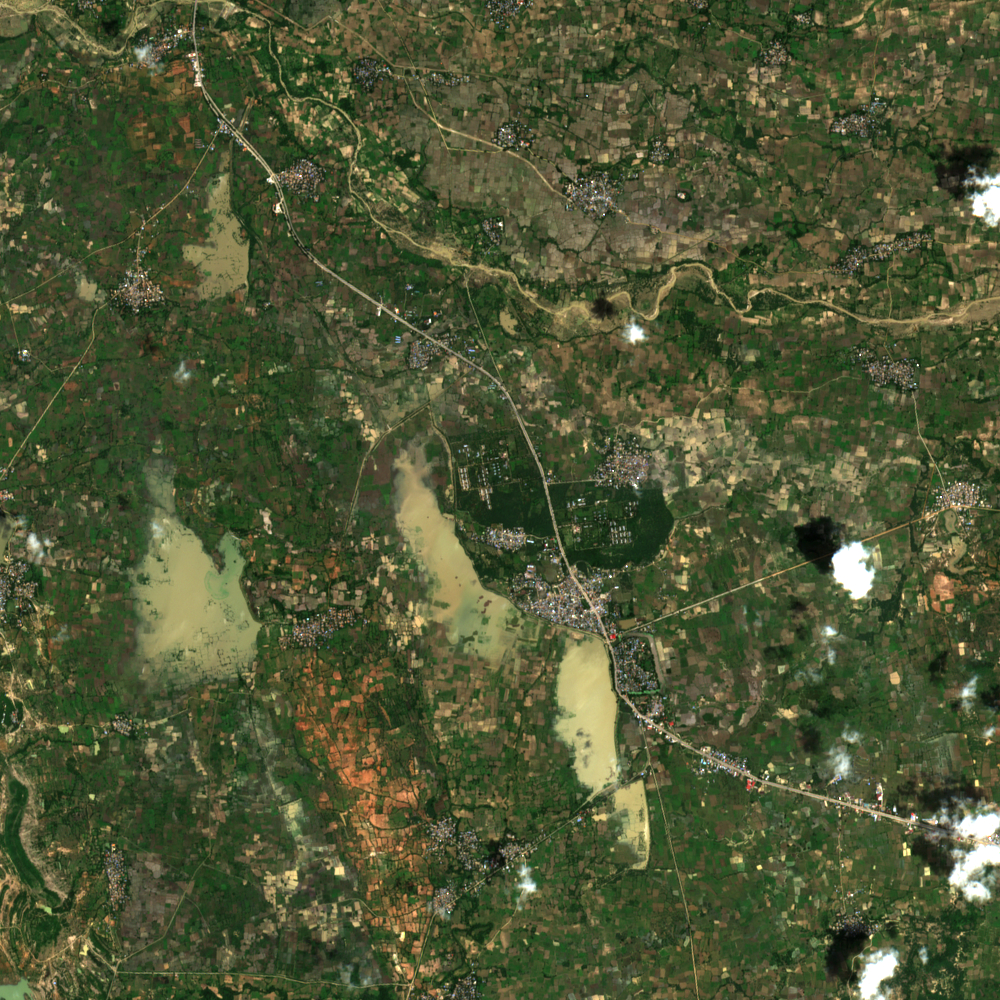
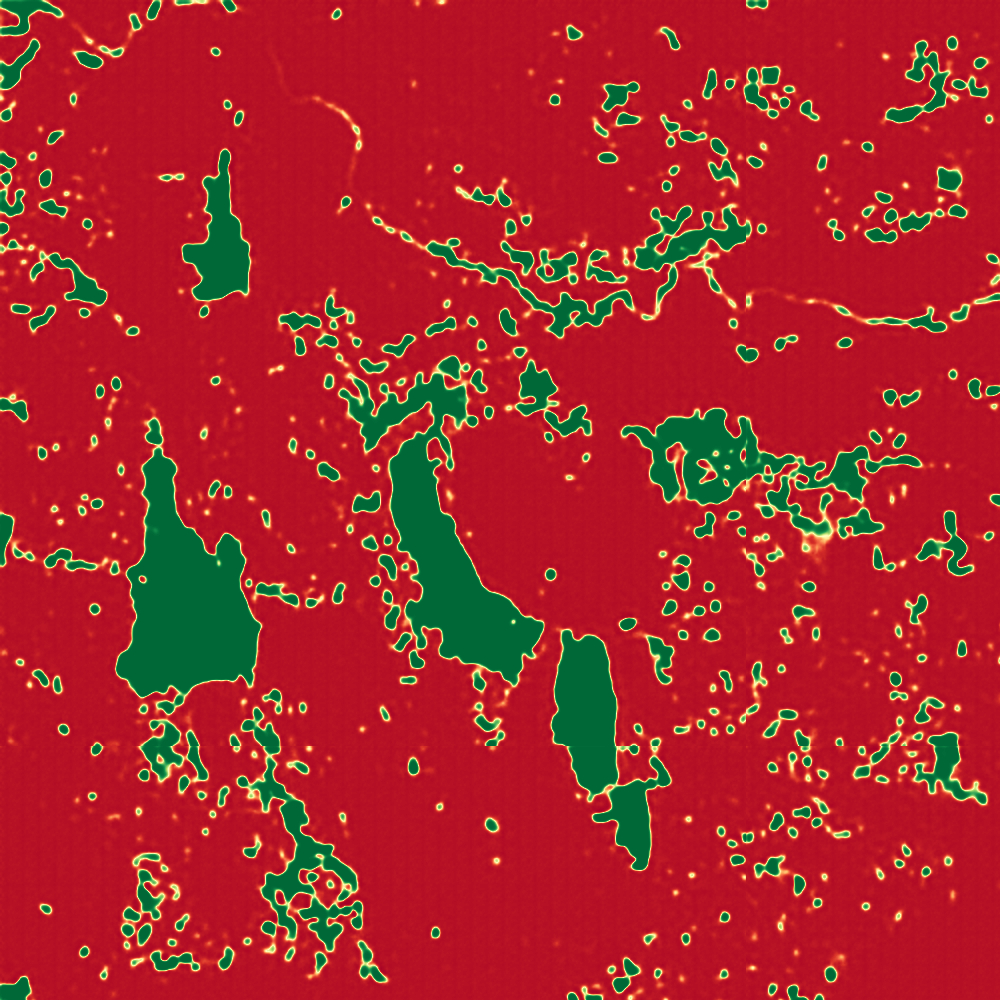

In [63]:
import leafmap

idx = 0
# Plot comparison using leafmap
leafmap.image_comparison(
    images[idx],
    pred_rgb,
    label1=titles[idx],
    label2="Generated data",
    starting_position=50,
    out_html="terramind_generation.html",
)


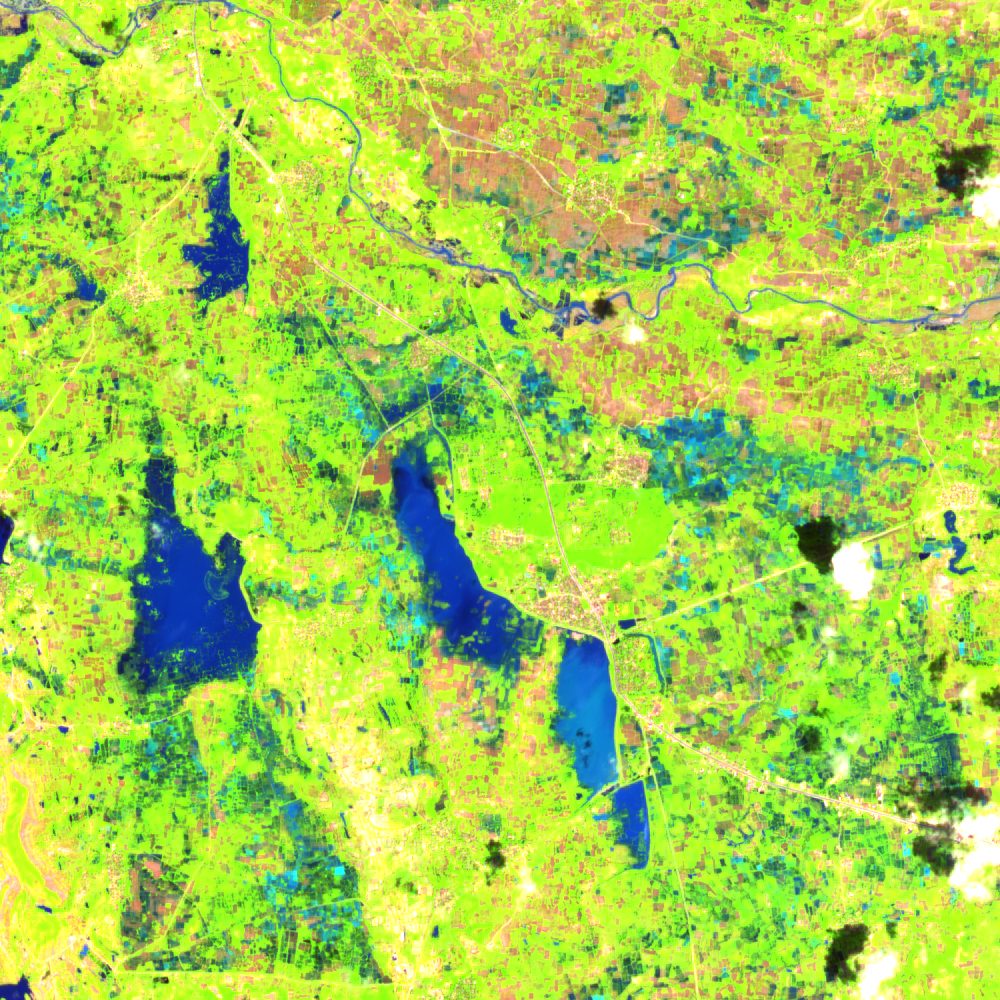
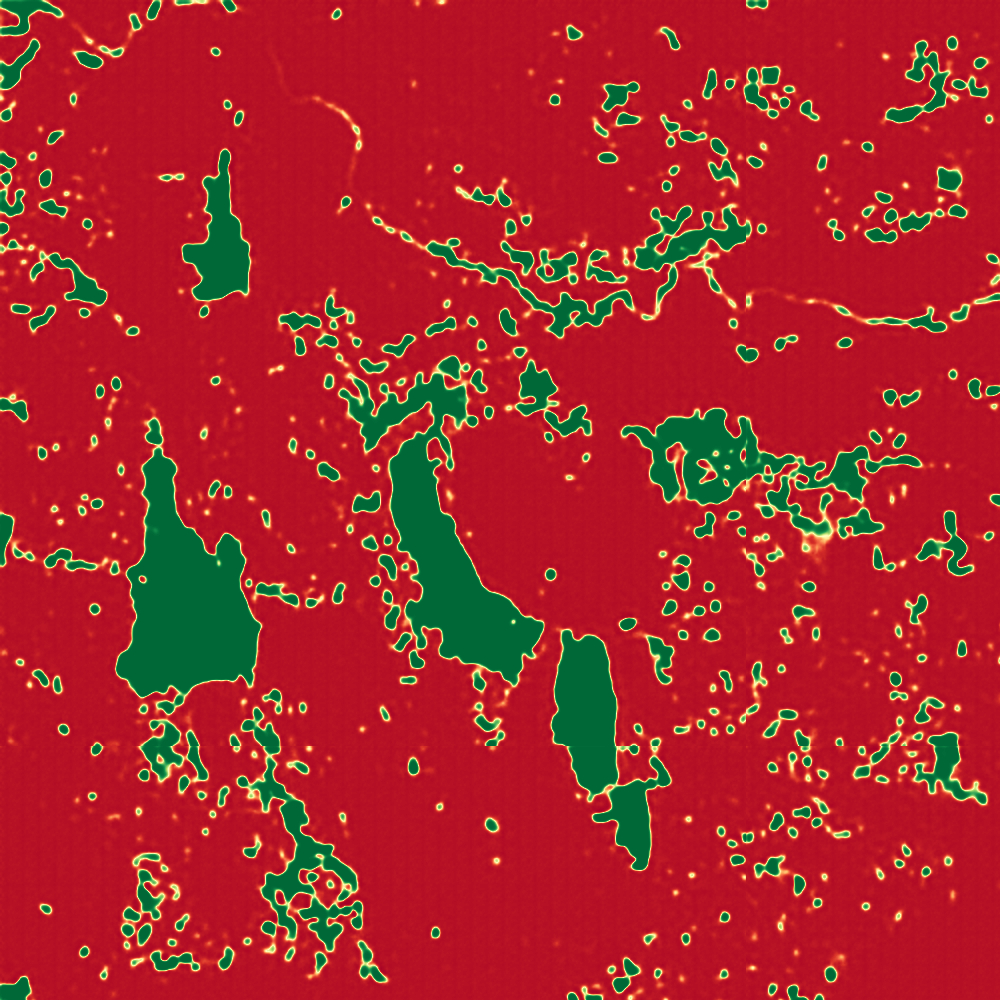

In [64]:
idx = 1
# Plot comparison using leafmap
leafmap.image_comparison(
    images[idx],
    pred_rgb,
    label1=titles[idx],
    label2="Generated data",
    starting_position=50,
    out_html="terramind_generation.html",
)